# **Setting up the variable values**

In [3]:
# initializing minimum probability to filter weak detections along with non-maxima suppression
MIN_CONF = 0.3
NMS_THRESH = 0.3

# define the minimum safe distance (in pixels) for woman :
MIN_DISTANCE = 25
redList=[]

In [4]:
from google.colab import drive
drive.mount('/content/gdrive')


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# **Creating the People Detection Function**

In [5]:
# import the necessary packages

import numpy as np
import cv2

def detect_people(frame, net, ln, personIdx=0):
	(H, W) = frame.shape[:2]
	results = []

	blob = cv2.dnn.blobFromImage(frame, 1 / 255.0, (416, 416),
		swapRB=True, crop=False)
	net.setInput(blob)
	layerOutputs = net.forward(ln)

	boxes = []
	centroids = []
	confidences = []

	for output in layerOutputs:
	
		for detection in output:
		
			scores = detection[5:]
			classID = np.argmax(scores)
			confidence = scores[classID]
			if classID == personIdx and confidence > MIN_CONF:
			
				box = detection[0:4] * np.array([W, H, W, H])
				(centerX, centerY, width, height) = box.astype("int")

				x = int(centerX - (width / 2))
				y = int(centerY - (height / 2))

				boxes.append([x, y, int(width), int(height)])
				centroids.append((centerX, centerY))
				confidences.append(float(confidence))

	idxs = cv2.dnn.NMSBoxes(boxes, confidences, MIN_CONF, NMS_THRESH)

	if len(idxs) > 0:

		for i in idxs.flatten():
		
			(x, y) = (boxes[i][0], boxes[i][1])
			(w, h) = (boxes[i][2], boxes[i][3])

			r = (confidences[i], (x, y, x + w, y + h), centroids[i])
			results.append(r)

	# return the list of results
	return results

# **Grab frames from video and make prediction measuring distances of detected people**

loading YOLO from disk...
[INFO] accessing video stream...


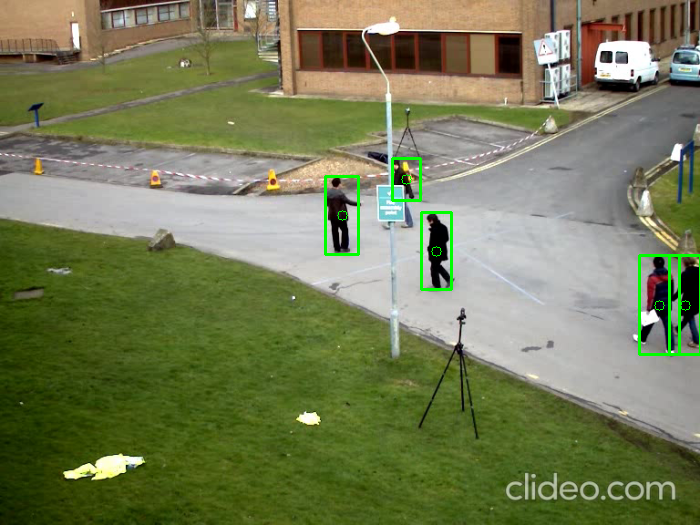

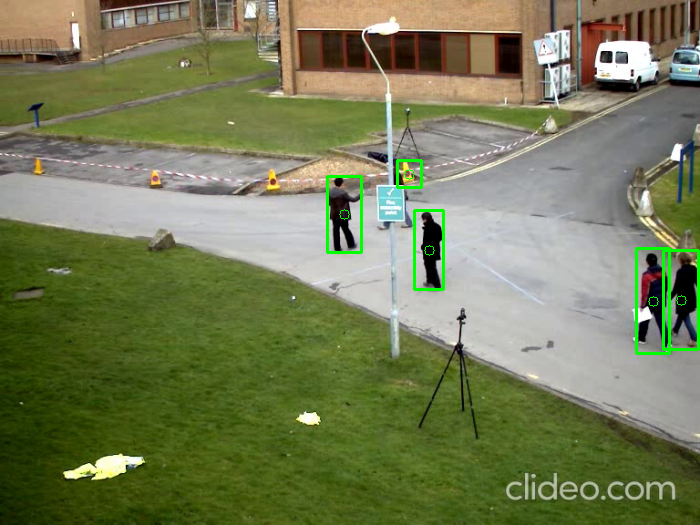

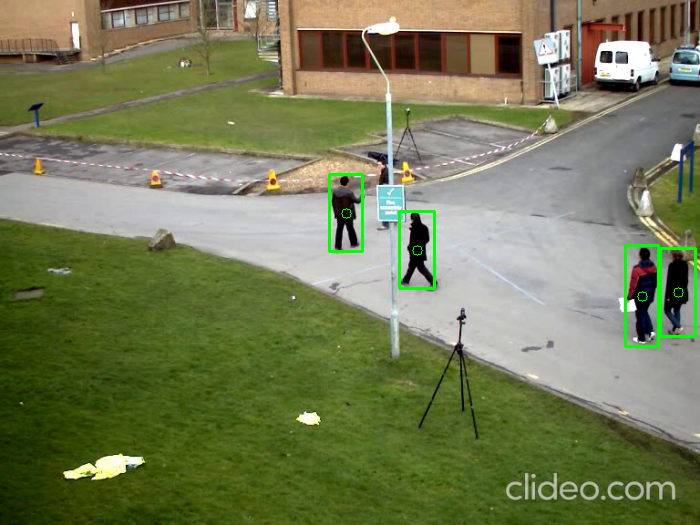

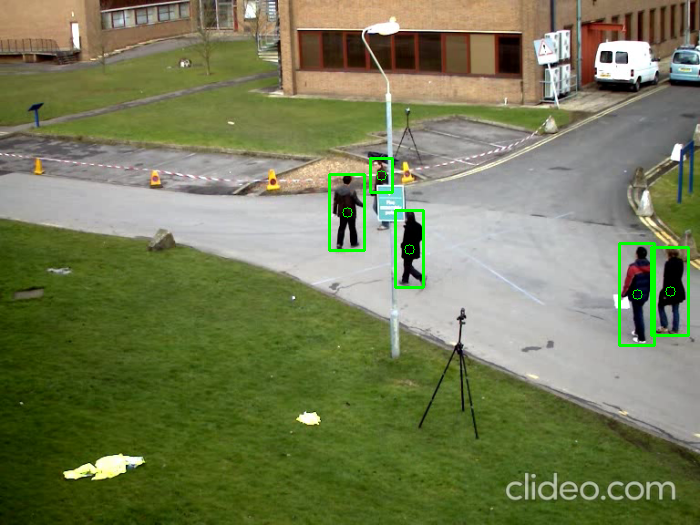

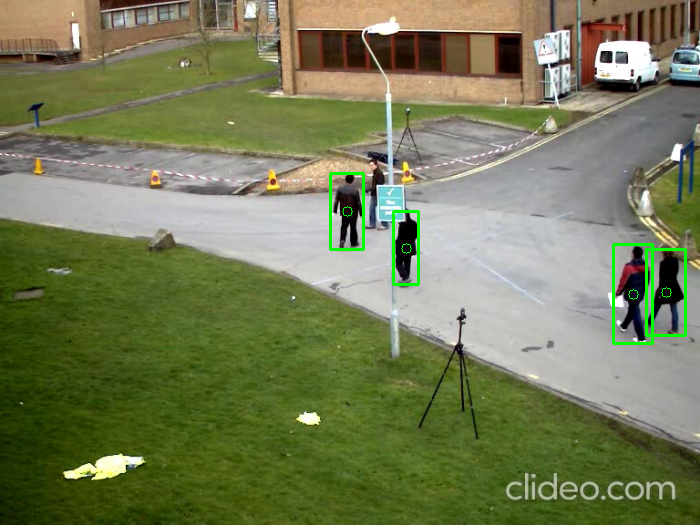

...

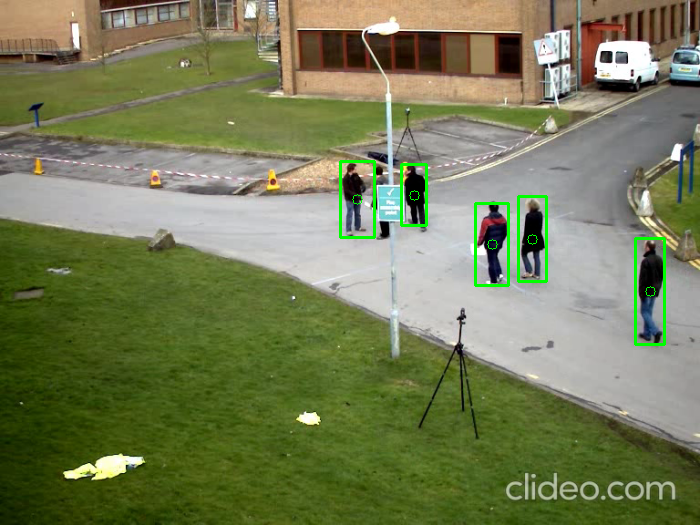

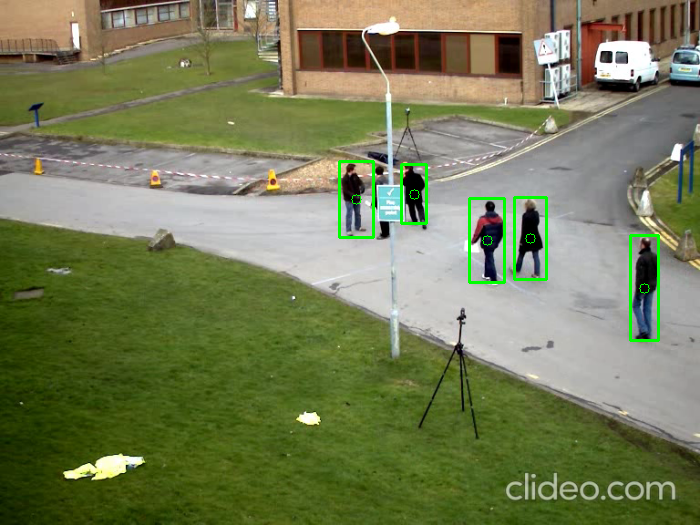

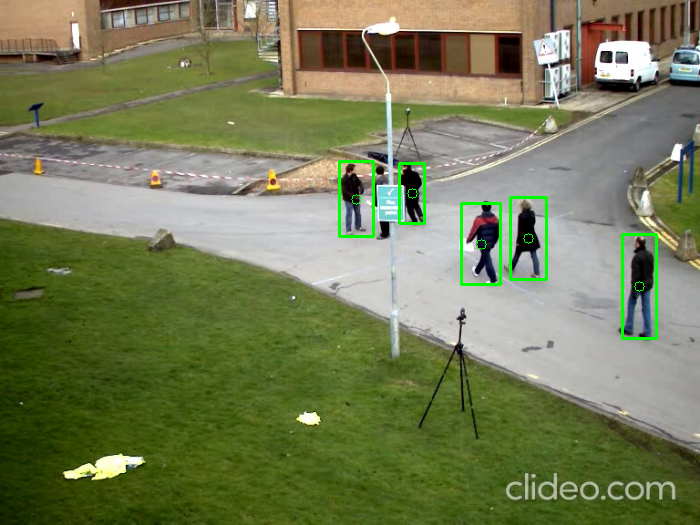

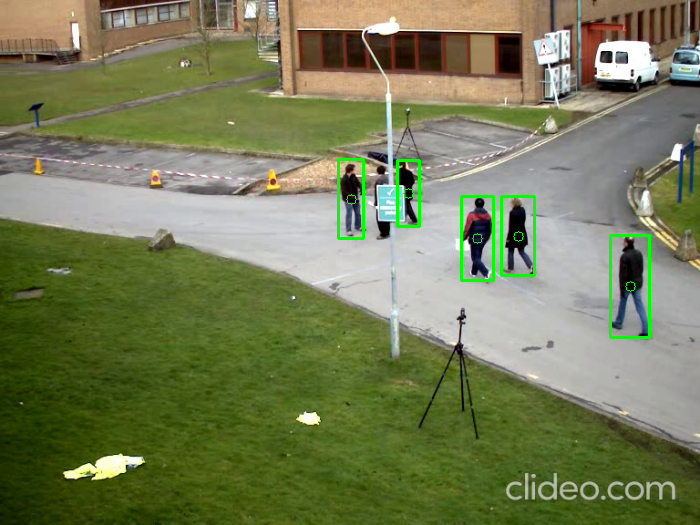

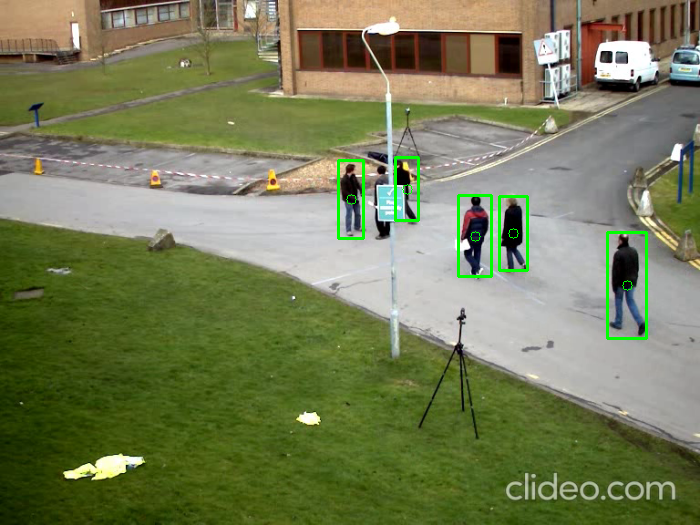

In [6]:
# import the necessary packages
from google.colab.patches import cv2_imshow
from scipy.spatial import distance as dist
import numpy as np
import argparse
import imutils
import cv2
import os

alert=False
ap = argparse.ArgumentParser()
ap.add_argument("-i", "--input", type=str, default="",
	help="path to (optional) input video file")
ap.add_argument("-o", "--output", type=str, default="",
	help="path to (optional) output video file")
ap.add_argument("-d", "--display", type=int, default=1,
	help="whether or not output frame should be displayed")
args = vars(ap.parse_args(["--input","/content/gdrive/MyDrive/proximity_detection/test.avi","--output","proximity_detection.avi","--display","1"]))

# load the COCO class labels our YOLO model was trained on
labelsPath = os.path.sep.join(["/content/gdrive/MyDrive/proximity_detection/yolo-coco/coco.names"])
LABELS = open(labelsPath).read().strip().split("\n")

# derive the paths to the YOLO weights and model configuration
weightsPath = os.path.sep.join(["/content/gdrive/MyDrive/proximity_detection/yolo-coco/yolov3.weights"])
configPath = os.path.sep.join(["/content/gdrive/MyDrive/proximity_detection/yolo-coco/yolov3.cfg"])


print("loading YOLO from disk...")
net = cv2.dnn.readNetFromDarknet(configPath, weightsPath)


ln = net.getLayerNames()
ln = [ln[i[0] - 1] for i in net.getUnconnectedOutLayers()]

# initialize the video stream and pointer to output video file
print("[INFO] accessing video stream...")
vs = cv2.VideoCapture(args["input"] if args["input"] else 0)
writer = None

# loop over the frames from the video stream
while True:

	(grabbed, frame) = vs.read()
  
	if not grabbed:
		break

	
	frame = imutils.resize(frame, width=700)
	results = detect_people(frame, net, ln,
		personIdx=LABELS.index("person"))
 
	violate = set()

	if len(results) >= 2:
	
		centroids = np.array([r[2] for r in results])
		D = dist.cdist(centroids, centroids, metric="euclidean")

		for i in range(0, D.shape[0]):
			for j in range(i + 1, D.shape[1]):
			
				if D[i, j] < MIN_DISTANCE:
					crp=frame[startY:endY,startX:endX]
					alert=True
					redList.append(crp)
					violate.add(i)
					violate.add(j)

	# loop over the results
	for (i, (prob, bbox, centroid)) in enumerate(results):
		(startX, startY, endX, endY) = bbox
		(cX, cY) = centroid
		color = (0, 255, 0)
		if i in violate:
			color = (0, 0, 255)

		cv2.rectangle(frame, (startX, startY), (endX, endY), color, 2)
		cv2.circle(frame, (cX, cY), 5, color, 1)

	if args["display"] > 0:
		# show the output frame
		cv2_imshow(frame)
		key = cv2.waitKey(1) & 0xFF

		if key == ord("q"):
			break

	if args["output"] != "" and writer is None:
		# initialize our video writer
		fourcc = cv2.VideoWriter_fourcc(*"MJPG")
		writer = cv2.VideoWriter(args["output"], fourcc, 25,
			(frame.shape[1], frame.shape[0]), True)

	# video file
	if writer is not None:
		writer.write(frame)